# Phys 481: Fourier Freestyle

In [1]:
import numpy as np
import scipy
import time
import matplotlib.pyplot as plt

from IPython.display import Audio
import scipy.io.wavfile
import wave

import scipy.signal as signal
from pydub import AudioSegment

## 1. Basic Vocal Suppression

In general, complete removal of voice in a song with integrated voiceover is not an easy task, but if a file has two channels, there exists an 'exploit' that can achieve this task to some degree. Suppose we have channel 1 and channel 2 audio. Then the sound without voice can be recovered by subtracting one channel from the other:

$$\frac{(\text{ channel1 - channel 2 })}{2}$$

This works because after creators record the background sound, voiceover is inserted and 'centered' around both channel. So inversing one channel and adding it to the other channel completely removes the voiceover in theory.

### Nice Example: Mulan
Here we work with 'I'll make a man out of you' song from Disney's Mulan. First download the song from youtube. youtube_dl is a convenient package that downloads and converts its mp3 file into wav using ffmpeg.

In [2]:
"""
from __future__ import unicode_literals
import youtube_dl


ydl_opts = {
    'format': 'bestaudio/best',
    'postprocessors': [{
        'key': 'FFmpegExtractAudio',
        'preferredcodec': 'wav',
        'preferredquality': '192',
    }],
}
with youtube_dl.YoutubeDL(ydl_opts) as ydl:
    ydl.download(['https://www.youtube.com/watch?v=ZSS5dEeMX64&ab_channel=xFliiy'])
"""

[youtube] ZSS5dEeMX64: Downloading webpage
[youtube] ZSS5dEeMX64: Downloading video info webpage
[youtube] ZSS5dEeMX64: Extracting video information
[youtube] ZSS5dEeMX64: Downloading MPD manifest
[download] Destination: Mulan - i'll make a man out of you-ZSS5dEeMX64.webm
[download] 100% of 3.03MiB in 00:00                  
[ffmpeg] Destination: Mulan - i'll make a man out of you-ZSS5dEeMX64.wav
Deleting original file Mulan - i'll make a man out of you-ZSS5dEeMX64.webm (pass -k to keep)


and load

In [3]:
datarate,wavedata=scipy.io.wavfile.read("Mulan - i'll make a man out of you-ZSS5dEeMX64.wav")

np.ndarray of wavedata has the shape

In [4]:
wavedata.shape # latter is channel

(9734861, 2)

which means it has two channels.

In [5]:
#split channels
ch1=wavedata[:,0]
ch2=wavedata[:,1]

with their wave data looking similar, but not completely identical:

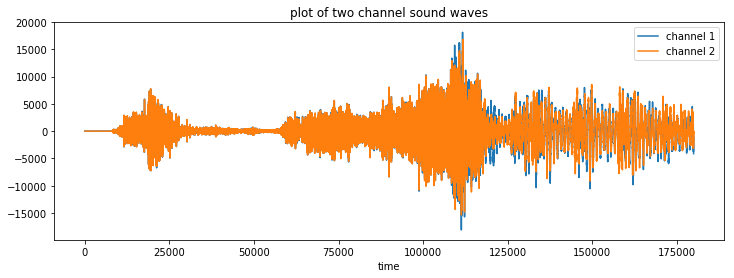

In [6]:
plt.figure(figsize=[12,4])
plt.plot(ch1[:180000],label='channel 1')
plt.plot(ch2[:180000],label='channel 2')
plt.title("plot of two channel sound waves")
plt.xlabel("time")
plt.legend()
plt.show()

now suppress the sound by subtracting ch2 from ch1

In [7]:
voice_supressed=(ch1-ch2)/2

that looks like

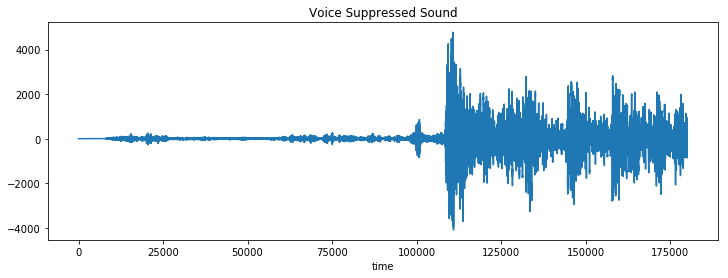

In [8]:
plt.figure(figsize=[12,4])
plt.plot(voice_supressed[:180000])
plt.title("Voice Suppressed Sound")
plt.xlabel("time")
plt.show()

now we're ready to compare the original with voice supression

#### original
Channel 1 and Channel 2 sound very similar. so wlog, we choose 1. It's unwise to include the entire song as wav files are uncompressed, that is, the file size for a 3 minute song of this type can be very large (~40 MB). So we severely restrict the duration and begin on a point where the voice over begins.

In [9]:
Audio(wavedata[:,0][1200000:2200000],rate=datarate)

#### Voice Surpressed

In [47]:
Audio(voice_supressed[1200000:2200000],rate=datarate)

If one concentrates enough (and with a good speaker), it's possible to spot the small residues of the singer's voice, but it's clear most of the voice is gone.

### Complicated Example: Frozen
Frozen's 'Let it Go' by Idina Menzel  is an example where this voice removal technique fails utterly. We carefully choose a youtube version of the song with minimum post-processing.

In [10]:
"""
from __future__ import unicode_literals
import youtube_dl


ydl_opts = {
    'format': 'bestaudio/best',
    'postprocessors': [{
        'key': 'FFmpegExtractAudio',
        'preferredcodec': 'wav',
        'preferredquality': '192',
    }],
}
with youtube_dl.YoutubeDL(ydl_opts) as ydl:
    ydl.download(['https://www.youtube.com/watch?v=L0MK7qz13bU&ab_channel=DisneyUK'])
"""

[youtube] L0MK7qz13bU: Downloading webpage
[youtube] L0MK7qz13bU: Downloading video info webpage
[youtube] L0MK7qz13bU: Extracting video information
[youtube] L0MK7qz13bU: Downloading MPD manifest
[download] Destination: FROZEN _ Let It Go Sing-along _ Official Disney UK-L0MK7qz13bU.webm
[download] 100% of 3.80MiB in 00:00                  
[ffmpeg] Destination: FROZEN _ Let It Go Sing-along _ Official Disney UK-L0MK7qz13bU.wav
Deleting original file FROZEN _ Let It Go Sing-along _ Official Disney UK-L0MK7qz13bU.webm (pass -k to keep)


and load

In [11]:
datarate,wavedata=scipy.io.wavfile.read("FROZEN _ Let It Go Sing-along _ Official Disney UK-L0MK7qz13bU.wav")

it also has two channels like in Mulan's case:

In [12]:
wavedata.shape # latter is channel

(11646327, 2)

In [13]:
ch1=wavedata[:,0]
ch2=wavedata[:,1]
voice_suppressed=(ch1-ch2)/2

#### Original

In [14]:
Audio(wavedata[:,0][6200000:7200000],rate=datarate)

#### Voice Suppressed

In [15]:
Audio(voice_suppressed[6200000:7200000],rate=datarate)

Voice has been suppressed, but to a much lesser extent than the mulan's case. We're not very confident, but we believe it's due to lot of sound post-processing effects of modern Disney (Frozen came out in 2013 vs 1998 of Mulan) films where effects are applied to two channels separately altogether with the voice overs. This may explain why in the voice suppressed sound, the residue of singer's voice can only be heard in the form of 'echo', which is a result of post-processing

But if the above is not the case, we can further attempt to suppress the voice using the Singer's vocal range. The singer, Idina Kim Menzel has a vocal range of C3-C6 ($130 \sim 1046 $ Hz). We can use FFT to remove sound with such frequency:

First note FFT (Cooley–Tukey algorithm) is most efficient when the data size is close to powers of 2 and we should stay away from primes at all times especially for larger numbers, so pad the data such that its length as a power of 2.

In [16]:
voice_suppressed.shape

(11646327,)

the closest power of 2 is:

In [17]:
2**24

16777216

then do FFT and filter

In [18]:
#pad and paste upto some point
voice_sup_padded=np.zeros(2**24)
voice_sup_padded[:len(voice_suppressed)]=voice_suppressed

In [19]:
#FFT
fftfreq=np.fft.fftfreq(len(voice_sup_padded),d=1/datarate)
freqdata=np.fft.fft(voice_sup_padded)

In [20]:
#filter
filterpass=(np.abs(fftfreq)<130.8) | (np.abs(fftfreq)>1046.5) #pass for sound outside the singer's vocal range
filtered_data=np.real(np.fft.ifft(filterpass*freqdata))

In [21]:
Audio(filtered_data[6200000:7200000],rate=datarate)

The quality hit on the song is quite devastating and the 'echo' of the singer's voice clearly survived (although one can claim it helped remove some of it as well). So in general this method is ill advised, unless an extra information exists that can finely subdivide the singer's vocal range so that there is no quality drop in the background sound.

## 2. Basic Sound Filters

### Gaussian Filter via Convolution

Gaussian filter, or sometimes referred to as Gaussian smooth is a process in which the signal is convolved with a finite gaussian signal. To most people who are interesting in sound processing, it is quite trivial and dull, but in the programmer's perspective who's working with sound, it is an excellent example that shows the power of FFT. First fetch Beetoven's song from a youtube.

In [22]:
"""
from __future__ import unicode_literals
import youtube_dl


ydl_opts = {
    'format': 'bestaudio/best',
    'postprocessors': [{
        'key': 'FFmpegExtractAudio',
        'preferredcodec': 'wav',
        'preferredquality': '192',
    }],
}
with youtube_dl.YoutubeDL(ydl_opts) as ydl:
    ydl.download(['https://www.youtube.com/watch?v=k_UOuSklNL4&ab_channel=wmd10'])
"""

[youtube] k_UOuSklNL4: Downloading webpage
[youtube] k_UOuSklNL4: Downloading video info webpage
[youtube] k_UOuSklNL4: Extracting video information
[youtube] k_UOuSklNL4: Downloading MPD manifest
[download] Destination: Beethoven-Fur Elise-k_UOuSklNL4.webm
[download] 100% of 3.14MiB in 00:00                  
[ffmpeg] Destination: Beethoven-Fur Elise-k_UOuSklNL4.wav
Deleting original file Beethoven-Fur Elise-k_UOuSklNL4.webm (pass -k to keep)


load and make gaussian function.

In [23]:
datarate,wavedata=scipy.io.wavfile.read("Beethoven-Fur Elise-k_UOuSklNL4.wav")

#define gaussian
gaussian= lambda x: np.exp(-x**2)

This song has two channels:

In [24]:
wavedata.shape # latter is channel

(8502160, 2)

In [25]:
#separate channels
ch1=wavedata[:,0]
ch2=wavedata[:,1]

Suppose one tries to apply gaussian filter directly using convolution process. For small point spread function (kernel), this would be no problem:

In [26]:
#gaussian of size 
begin=time.time() #measure time

x=np.linspace(-1,1,400)
convolved=np.convolve(ch1,gaussian(x))

end=time.time()

print("Time taken: ",end-begin," seconds")

Time taken:  0.729041576385498  seconds


But what if we want a wide gaussian function as our point spread function?

In [80]:
#gaussian of size 
begin=time.time() #measure time

x=np.linspace(-1000,1000,40000)
convolved=np.convolve(ch1,gaussian(x))

end=time.time()

print("Time taken: ",end-begin," seconds")

Time taken:  31.63280940055847  seconds


A filter that drastically changes its performance in general would not be a good filter tool (technically this problem can be solved by 'rescaling' the range of x and number of points at some cost, but it's still undesriable).

Here is where the power of FFT comes into play:

FT theorem: For signal $f$ and $g$, the convolution $f*g$ is
$$f*g=F^{-1}(F(f)\cdot F(g))$$

where by convention, $F$ denotes fourier transform and $*$ denotes convolution of functions $f$ and $g$.

Now apply this formula.  
Again, pad data until it's a power of 2 for FFT efficiency.

In [86]:
ch1.shape

(8502160,)

The cloests power of 2 to this prime is

In [87]:
2**24

16777216

In [88]:
#pad wavedata
wave_padded=np.zeros(2**24)
wave_padded[:len(wavedata)]=ch1

# x values for gaussian
x=np.linspace(-1000,1000,40000)

# pad kernel as well since we need to multiply it with wave_padded
kernel_padded=np.zeros(len(wave_padded))
kernel_padded[len(wave_padded)//2 : len(wave_padded)//2+len(x)]=gaussian(x)

In [89]:
#fft data and kernel

begin=time.time() #measure time

fftdata=np.fft.fft(wave_padded)
fftkernel=np.fft.fft(kernel_padded)

end=time.time()

print("Time taken: ",end-begin," seconds")

Time taken:  2.7761590480804443  seconds


In [90]:
#inverse FFT. get filtered result

begin=time.time() #measure time

g_filtered=np.real(np.fft.ifft(fftdata*fftkernel))

end=time.time()

print("Time taken: ",end-begin," seconds")

Time taken:  1.536087989807129  seconds


In [78]:
Audio(ch1[:450000],rate=datarate)

In [79]:
Audio(g_filtered[len(g_filtered)//2:len(g_filtered)//2+450000],rate=datarate) # begin at half since it was padded

Thus we succesfully created an efficinet gaussian filter (~4 seconds vs ~30 seconds ). If we increase the length of kernel (gaussian), if one uses the regular convolution, the computation time will increase exponentially and if one uses FFT, time will increase as N logN, made possible because of FFT.